In [158]:
#imports
import os
import numpy as np
import pandas as pd
import scipy.stats as stats
import re

#nilearn
from nilearn import plotting, image
import nilearn.connectome as nic

#plotting
import matplotlib.pyplot as plt

#hcp labels
import hcp_utils as hcp

#model
from sklearn.manifold import SpectralEmbedding
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.decomposition import PCA

#splitting into training and test
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import train_test_split

#Assement of the model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import mean_squared_error

from load_data import *

The Python package you are importing, AtlasReader, is licensed under the
BSD-3 license; however, the atlases it uses are separately licensed under more
restrictive frameworks.
By using AtlasReader, you agree to abide by the license terms of the
individual atlases. Information on these terms can be found online at:
https://github.com/miykael/atlasreader/tree/master/atlasreader/data



## Loading the Data

In [159]:
#import ICA data
ica_data, sub_id = load_txt(n=300)

Subject Data Loaded


In [160]:
atlas = load_atlas(n=300)
atlas_coords = get_atlas_coords(atlas)

/home/anmarkova/private/Public-DSC180B-Functional-Connectivity-Project/load_data.py:57: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  atlas = image.threshold_img(atlas, "99.5%")


atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 300)


In [163]:
df = get_handedness(sub_id, n=300).reset_index()

restricted_data loaded


In [165]:
#check that the order of subjects is the same
df['Subject'].to_list() == list(sub_id)

True

In [166]:
df.loc[df['Handedness'] < 0, ['hand_class']] = 'Left'
df.loc[df['Handedness'] > 0, ['hand_class']] = 'Right'
df.loc[df['Handedness'] == 0, ['hand_class']] = 'Both'

In [193]:
#create an array of handedness
handedness = df['Handedness'].to_numpy()

In [170]:
#region labels
region_labels = get_labels(atlas_coords)

[[np.float64(56.0), 'Right_Occipital_Pole'], [np.float64(9.0), 'Right_Lateral_Occipital_Cortex_inferior_division']]
[[np.float64(30.0), 'Left_Lingual_Gyrus'], [np.float64(30.0), 'Left_Intracalcarine_Cortex'], [np.float64(8.0), 'Left_Supracalcarine_Cortex'], [np.float64(7.0), 'Right_Lingual_Gyrus'], [np.float64(7.0), 'Right_Intracalcarine_Cortex']]
[[np.float64(44.0), 'Right_Lateral_Occipital_Cortex_superior_division'], [np.float64(13.0), 'Right_Occipital_Pole']]
[[np.float64(47.0), 'Left_Occipital_Pole'], [np.float64(7.0), 'Left_Lateral_Occipital_Cortex_inferior_division']]


KeyboardInterrupt: 

In [168]:
ica_data.shape

(1003, 4800, 300)

## EDA

### Handedness

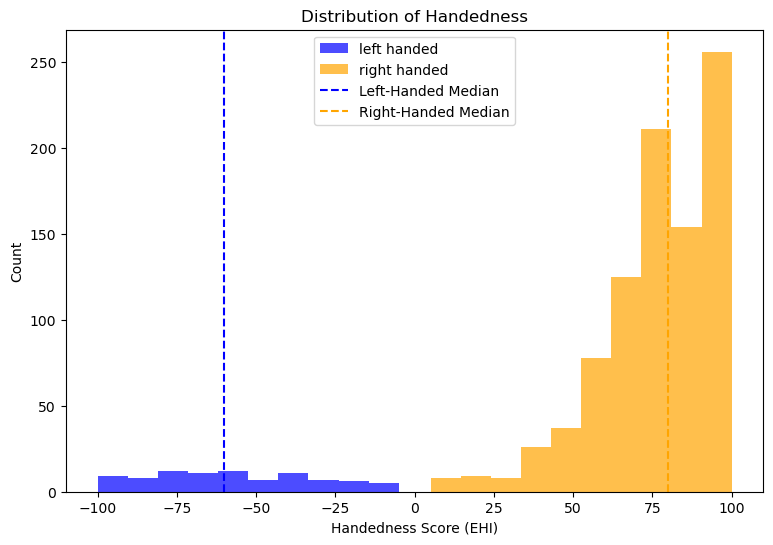

In [171]:
left_handed = df[df['Handedness'] < 0] 
right_handed = df[df['Handedness'] > 0]

fig, ax = plt.subplots(figsize = (9, 6))

#plot distributions
plt.hist(left_handed["Handedness"], color='blue', label='left handed', alpha=0.7)
plt.hist(right_handed["Handedness"], color='orange', label='right handed', alpha=0.7)

#plot medians
plt.axvline(left_handed['Handedness'].median(), color='blue', linestyle='--', label='Left-Handed Median')
plt.axvline(right_handed['Handedness'].median(), color='orange', linestyle='--', label='Right-Handed Median')

#add annotations
ax.set_title('Distribution of Handedness')
plt.ylabel('Count')
plt.xlabel('Handedness Score (EHI)')
plt.legend()

In [172]:
df.groupby('hand_class').describe()

Subject                                                     \
             count           mean            std       min        25%   
hand_class                                                              
Both           3.0  619412.666667  164258.274356  481042.0  528648.50   
Left          88.0  396133.397727  281578.563833  101915.0  162204.75   
Right        912.0  372492.587719  272564.076785  100206.0  153908.75   

                                         Handedness                        \
                 50%       75%       max      count       mean        std   
hand_class                                                                  
Both        576255.0  688598.0  800941.0        3.0   0.000000   0.000000   
Left        253243.5  640497.0  923755.0       88.0 -57.670455  26.576163   
Right       212065.5  586011.5  996782.0      912.0  78.514254  19.385789   

                                            
              min   25%   50%   75%    max  
hand_class                                  
Both          0.0   0.0   0.0   0.0    0.0  
Left       -100.0 -80.0 -60.0 -40.0   -5.0  
Right         5.0  70.0  80.0  95.0  100.0

### Brains

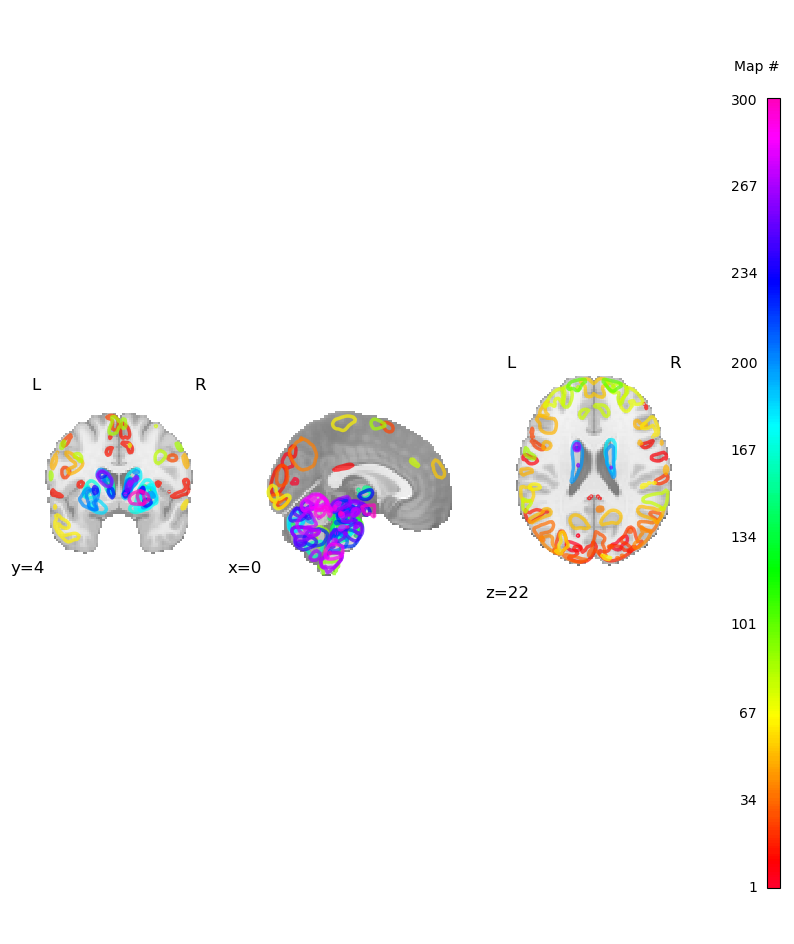

In [175]:
# plot atlas, all regions
fig, axs = plt.subplots(nrows=1, figsize=(10, 12))
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs)

In [177]:
ica_data.shape

#1003 - subjects
#4800 - data points
#300 - brain regions (359 per hemisphere)

(1003, 4800, 300)

## Constructing Correlation Matrices

In [178]:
#Correlation matrix
correlation_measure = nic.ConnectivityMeasure(kind='partial correlation')
correlation_matrix = correlation_measure.fit_transform(ica_data)

In [179]:
#replace 1.0 with np.nan for fisher's z transform
copy_matrix = correlation_matrix.copy()
copy_matrix[copy_matrix == 1.00] = np.nan

fisher_z_matrices = np.arctanh(copy_matrix)

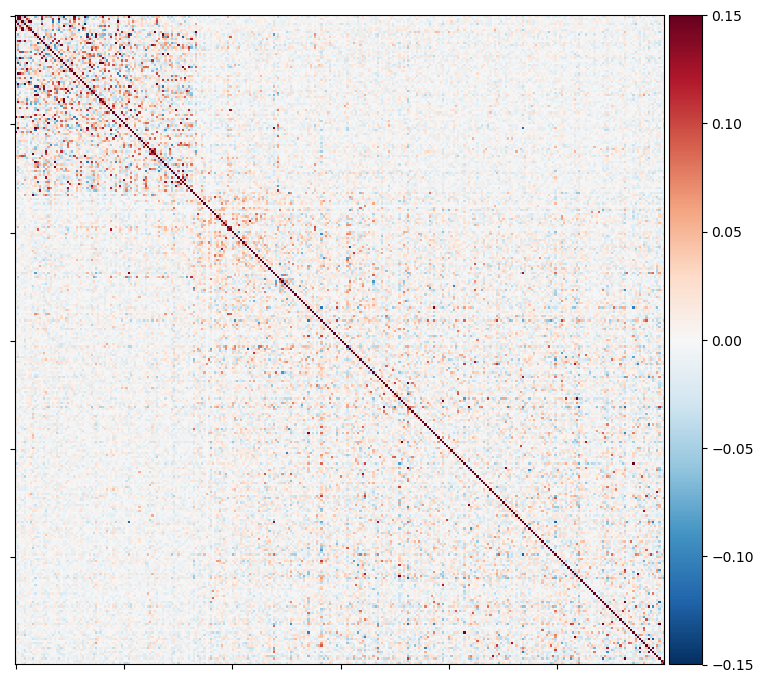

In [183]:
#average matrix
fig, ax = plt.subplots(figsize=(7, 7),
                       layout='constrained')
plotting.plot_matrix(
    correlation_measure.mean_, colorbar=True, vmax=0.15, vmin=-0.15, figure=fig
)

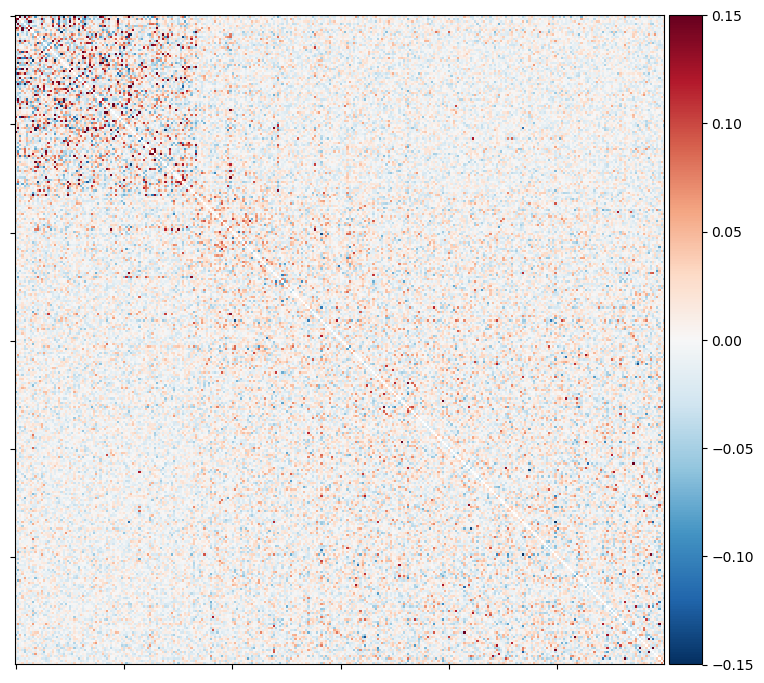

In [181]:
#example matrix
fig, ax = plt.subplots(figsize=(7, 7),
                       layout='constrained')
plotting.plot_matrix(
    fisher_z_matrices[0], colorbar=True, vmax=0.15, vmin=-0.15, figure=fig
)

## Bonferroni Correction

Not really sure if this potion is necessary

$$
p_{FWE} = 1-(1-p)^{N}
$$

$$
p = p_{FWE} / N
$$

Where $N$ is the number of test


In [18]:
count = 0
matrix_dim = fisher_z_matrices.shape
for i in range(matrix_dim[1]):
    for j in range(i, matrix_dim[1]):
        if i != j:
            count+=1

In [19]:
p_fwe = 1-(1-0.1)**(count)
p = p_fwe / count
p

3.8849586057660555e-06

In [184]:
#function that identifies whether a correlation is statistically significant
def calc_corr(fisher_z_matrices):
    corr_mat = {}
    pval_mat = {}
    count_pval = 0
    matrix_dim = fisher_z_matrices.shape
    for i in range(matrix_dim[1]):
        for j in range(i, matrix_dim[1]):
            if i != j:
                corr, pval = stats.pearsonr(fisher_z_matrices[:,i, j],  handedness)
                corr_mat[(i, j)] = corr
                pval_mat[(i,j)] = pval
    print(count_pval)
    return corr_mat, pval_mat

In [185]:
#all significant correlations
corr_mat, pval_mat = calc_corr(fisher_z_matrices)
corr_sig = np.array(list(corr_mat.values()))

0


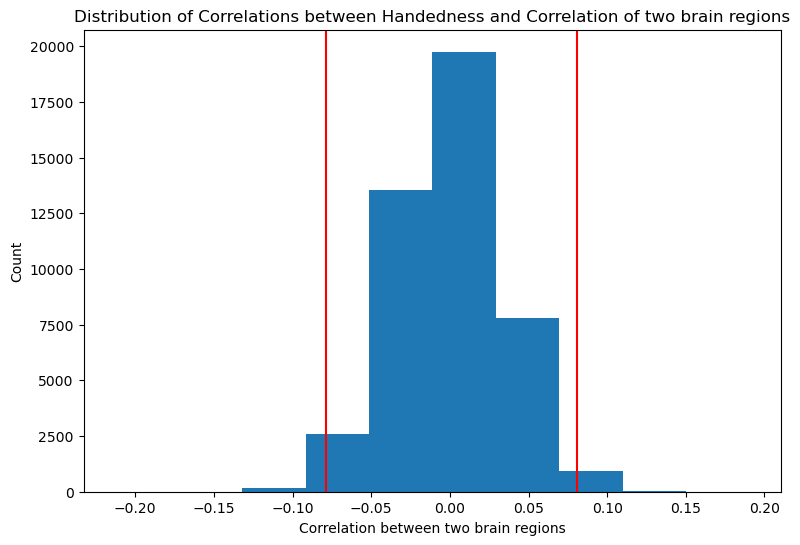

In [186]:
fig, ax = plt.subplots(figsize = (9, 6))
ax.hist(corr_sig)
bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
ax.axvline(bottom_5, color='red')
ax.axvline(top_5, color = 'red', label='0.01 significance level')
ax.set_title('Distribution of Correlations between Handedness and Correlation of two brain regions')
plt.xlabel("Correlation between two brain regions")
plt.ylabel("Count")
plt.show()

In [187]:
sorted_keys = sorted(corr_mat, key=lambda x: corr_mat[x])
for i in sorted_keys[:5]:
    print(f'For key {i} the correlation is {corr_mat[i]}')

print('---')
for i in sorted_keys[-5:]:
    print(f'For key {i} the correlation is {corr_mat[i]}')

For key (23, 63) the correlation is -0.21267401809543185
For key (4, 23) the correlation is -0.16906423430138318
For key (24, 38) the correlation is -0.1613973626605184
For key (55, 72) the correlation is -0.15379976426629938
For key (24, 60) the correlation is -0.14843632559875283
---
For key (126, 131) the correlation is 0.1435193112039898
For key (38, 43) the correlation is 0.14490498766344442
For key (30, 45) the correlation is 0.14628393474693263
For key (23, 78) the correlation is 0.1653811848251142
For key (30, 60) the correlation is 0.1904597184156815


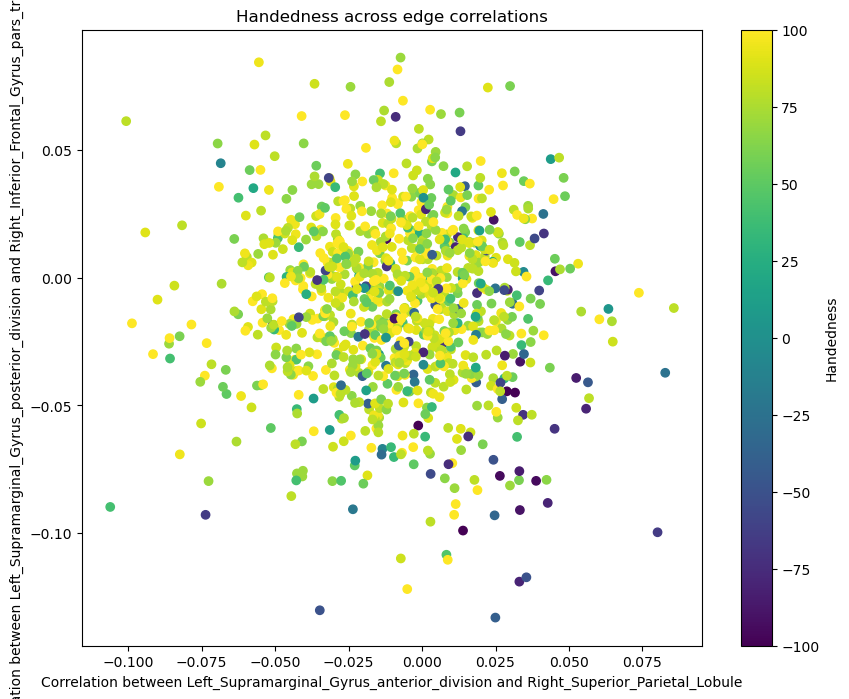

In [188]:
idx1 = 0
idx2 = -1

# Create the scatter plot
fig, ax = plt.subplots(figsize = (10, 8))

sc = ax.scatter(fisher_z_matrices[:, sorted_keys[idx1][0], sorted_keys[idx1][1]], 
                 fisher_z_matrices[:, sorted_keys[idx2][0], sorted_keys[idx2][1]], 
                 c=handedness, cmap='viridis')  
plt.xlabel(f'Correlation between {region_labels[sorted_keys[idx1][0]]} and {region_labels[sorted_keys[idx1][1]]}')
plt.ylabel(f'Correlation between {region_labels[sorted_keys[idx2][0]]} and {region_labels[sorted_keys[idx2][1]]}')

ax.set_title('Handedness across edge correlations')

# Add a colorbar
cbar = plt.colorbar(sc)
cbar.set_label('Handedness')  # Label the colorbar


# Show the plot
plt.show()


In [189]:
def select_edges(num):
    # get indeces transform top 10 strongest correlations 
    indx = [list(i) for i in sorted_keys[:num] + sorted_keys[-num:]]
    indx = np.array(indx).T
    # extract correlation of highest correlated region for every subject
    X = fisher_z_matrices[:, indx[0], indx[1]]
    return X

In [190]:
def plot_spectral_embedding(X_transformed):
    fig, ax = plt.subplots(figsize = (10, 8))

    #create scatter plot
    sc = ax.scatter(X_transformed[:, 0], X_transformed[:, 1], c=handedness, cmap='viridis')
    
    ax.set_title(f'Spectral Embedding of the Top {num*2} Edges Correlated with Handedness')
    
    # Add a colorbar
    cbar = plt.colorbar(sc)
    cbar.set_label('Handedness')  # Label the colorbar
    plt.show()


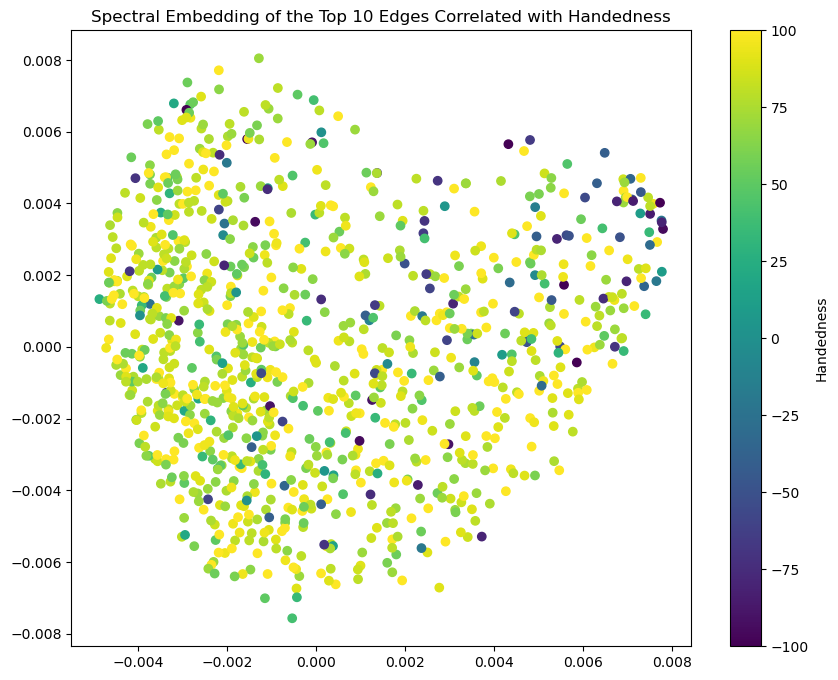

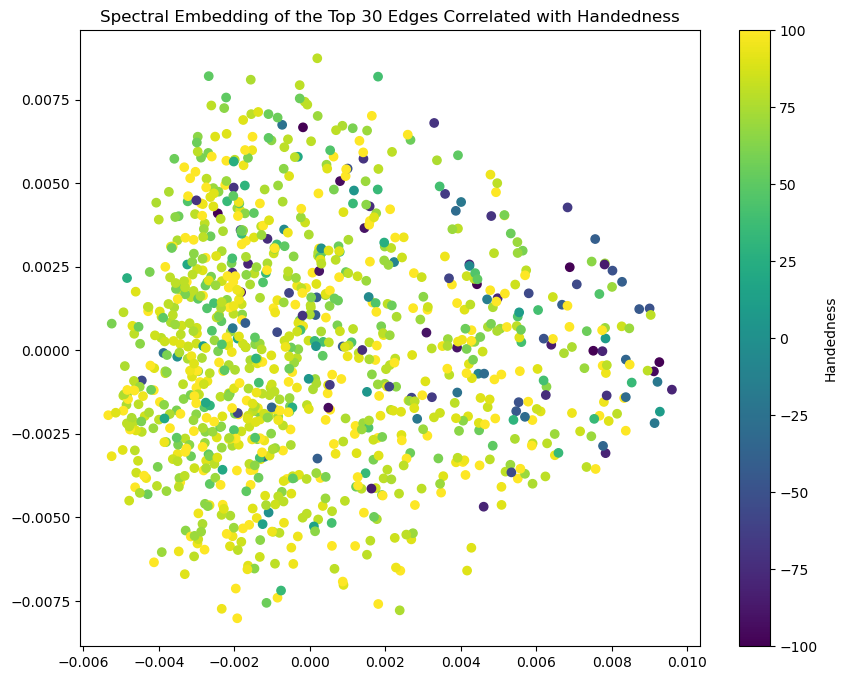

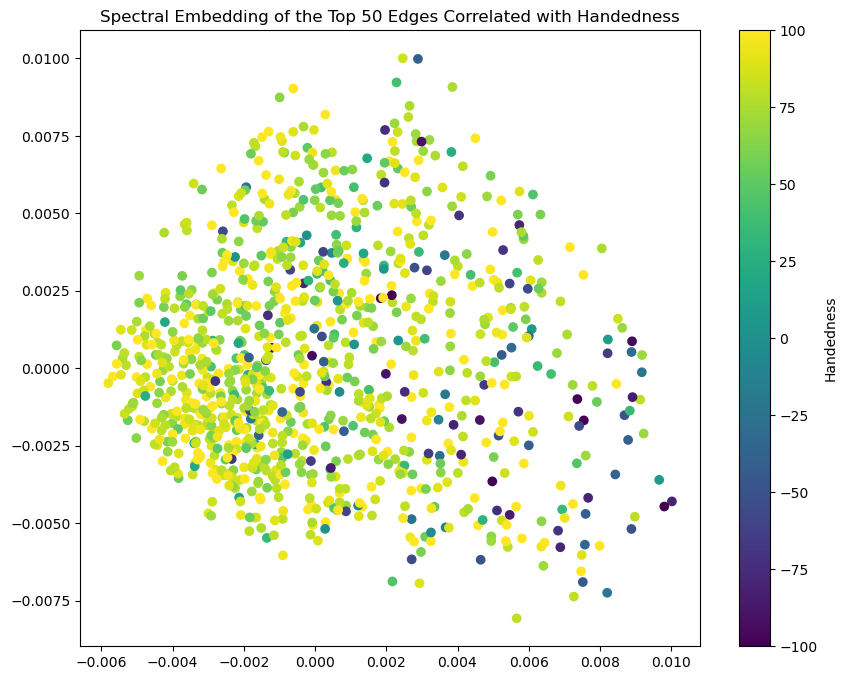

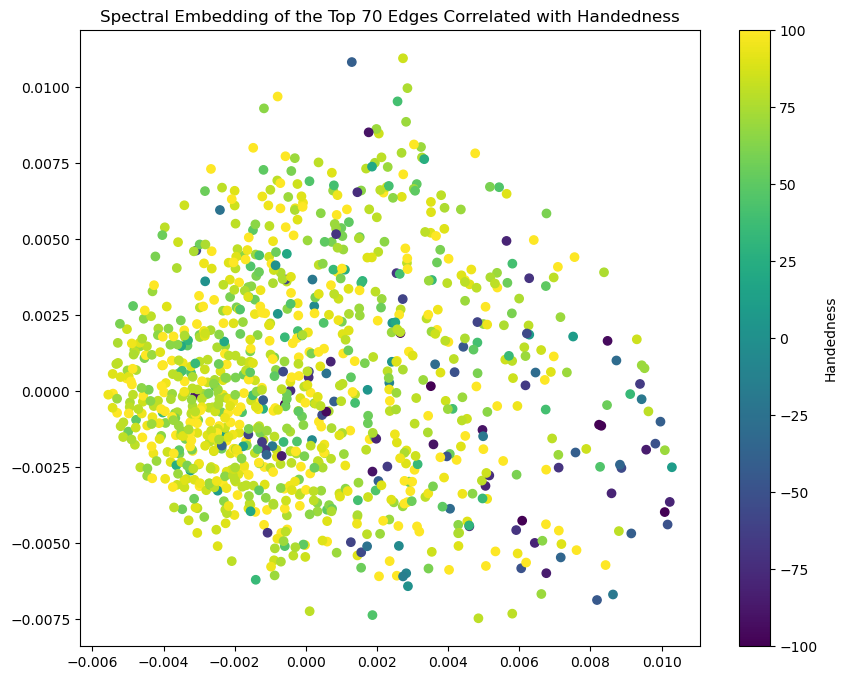

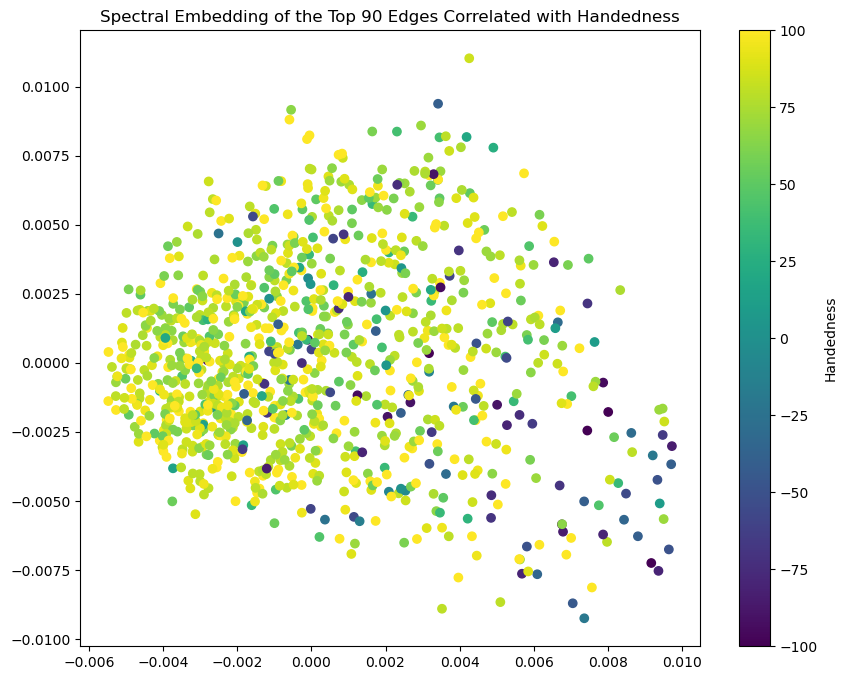

In [191]:
# Look if the data is separable with dimensionality reduction
nums = np.arange(5, 51, 10)
for num in nums:
    X = select_edges(num)
    #using nearesst neighbors as the distance function
    embedding = SpectralEmbedding(n_components=2)
    X_transformed = embedding.fit_transform(X)
    # X_transformed.shape
    plot_spectral_embedding(X_transformed)


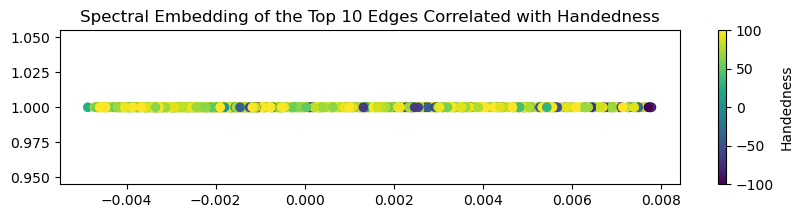

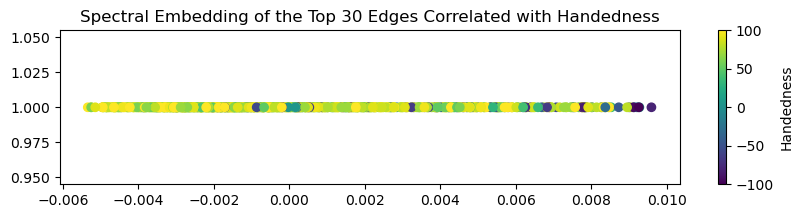

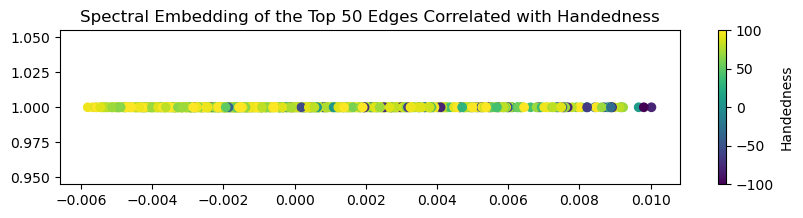

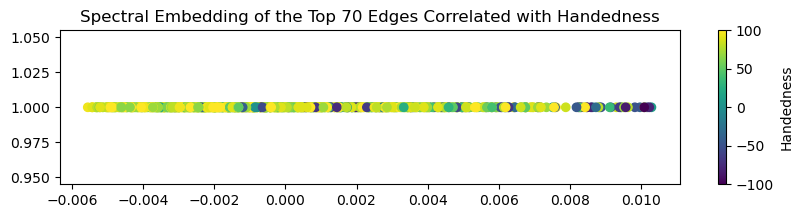

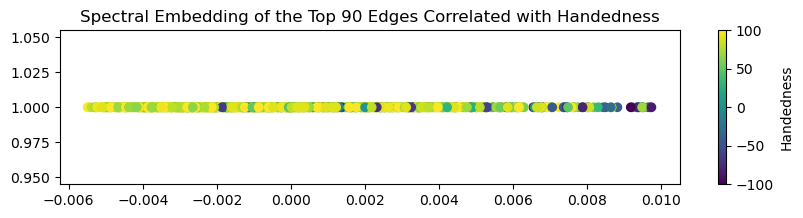

In [195]:
# Look if the data is separable with dimensionality reduction
nums = np.arange(5, 51, 10)
for num in nums:
    X = select_edges(num)
    #using nearesst neighbors as the distance function
    embedding = SpectralEmbedding(n_components=1)
    X_transformed = embedding.fit_transform(X)
    # X_transformed.shape
    fig, ax = plt.subplots(figsize = (10, 2))
    
    #create scatter plot
    sc = ax.scatter(X_transformed[:, 0], [1]*1003, c=handedness, cmap='viridis')
    
    ax.set_title(f'Spectral Embedding of the Top {num*2} Edges Correlated with Handedness')
    
    # Add a colorbar
    cbar = plt.colorbar(sc)
    cbar.set_label('Handedness')  # Label the colorbar
    plt.show()

## Classification with SMV

Kernel - Sigmoid

$K(x,y)=tanh(α⋅x^Ty+c)$

where the kernel coefficient $α$ controls the influence of each individual training sample on the decision boundary and is the bias term $c$ that shifts the data up or down.

In the sigmoid kernel, the similarity between two data points is computed using the hyperbolic tangent function ($tanh$). The kernel function scales and possibly shifts the dot product of the two point ($x$ and $y$).

In [196]:
#converting handedness to a class
# 1 - right handed
# 0 - left handed
handedness_class = (handedness > 0).astype(int)

In [204]:
nums = np.arange(5, 101, 5)
balanced_acc = []
for num in nums:
    for i in range(100):
        X = select_edges(num)
    
        #balance the dataset through oversampling
        sme = SMOTEENN() #random_state=40
        X_res, y_res = sme.fit_resample(X, handedness_class)
        
        # Split into a train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_res, y_res) #random_state=0
    
        #create an SVM Model
        clf =  SVC(kernel='sigmoid')
        clf.fit(X_train, y_train)
    
        y_pred = clf.predict(X_test)
    
        point = [num*2, balanced_accuracy_score(y_test, y_pred)]
        balanced_acc.append(point)

Balanced Accuracy is the average of recall obtained on each class

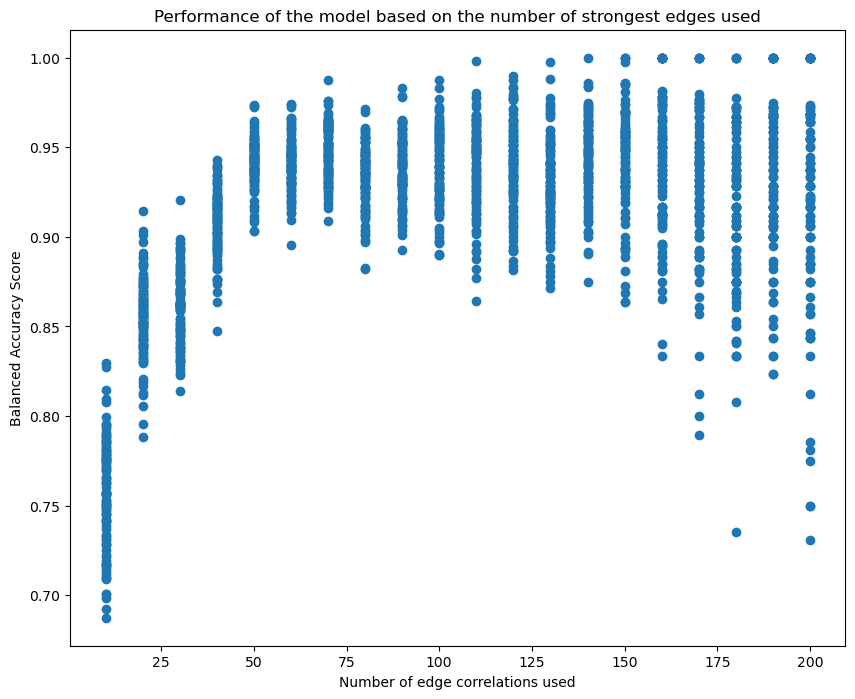

In [205]:
balanced_acc = np.array(balanced_acc) # Balanced Accuracy is the average of recall obtained on each class

fig, ax = plt.subplots(figsize = (10, 8))

#create scatter plot
sc = ax.scatter(balanced_acc[:, 0], balanced_acc[:, 1])

ax.set_title(f'Performance of the model based on the number of strongest edges used')

plt.xlabel('Number of edge correlations used')
plt.ylabel('Balanced Accuracy Score')

plt.show()


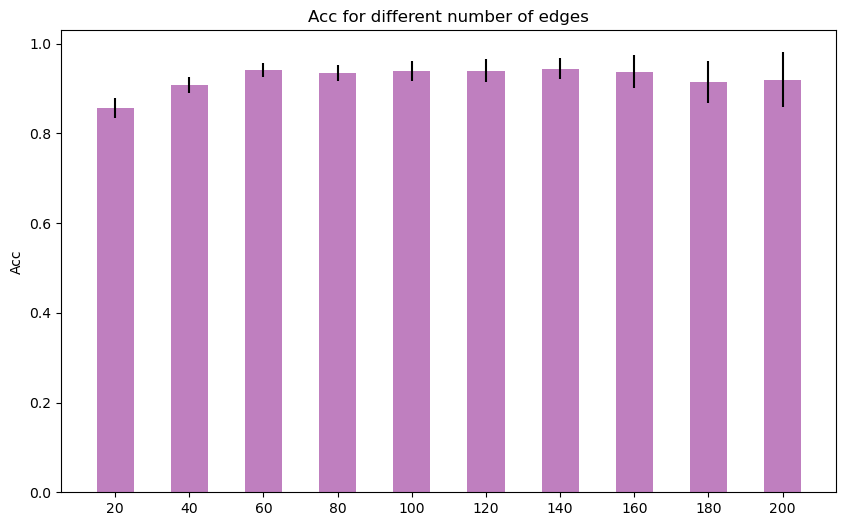

In [209]:

# Provided data
data = balanced_acc

# Convert to DataFrame
results = pd.DataFrame(data, columns=["Edges_Num", "Acc"])
results = results[(results['Edges_Num'] == 20) | (results['Edges_Num'] == 40) | (results['Edges_Num'] == 60) | (results['Edges_Num'] == 80) |(results['Edges_Num'] == 100) \
| (results['Edges_Num'] == 120) | (results['Edges_Num'] == 140) | (results['Edges_Num'] == 160) | (results['Edges_Num'] == 180) | (results['Edges_Num'] == 200)]

# Group by year and compute mean & standard deviation
grouped = results.groupby("Edges_Num")["Acc"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=10)

plt.xticks(mean_values.index)
plt.ylabel("Acc")
plt.title("Acc for different number of edges")
plt.show()

In [210]:
# 30 seems like a good number of edges
X = select_edges(80) #take top 15 and bottom 15 strongest

balanced_acc = []
confusion_mat = []
for i in range(100):    
    #balance the dataset through oversampling
    sme = SMOTEENN(random_state=82) #random_state=82
    X_res, y_res = sme.fit_resample(X, handedness_class)
    
    # Split into a train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res) # random_state=0
    
    #create an SVM Model
    clf =  SVC(kernel='sigmoid')
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_test)

    confusion_mat.append(confusion_matrix(y_test, y_pred))
    balanced_acc.append(balanced_accuracy_score(y_test, y_pred))
    
    # print(confusion_matrix(y_test, y_pred))
    # print(balanced_accuracy_score(y_test, y_pred))

In [211]:
#find the average
confusion_mat = np.array(confusion_mat)
balanced_acc = np.array(balanced_acc)

print(np.mean(balanced_acc))
print(np.mean(confusion_mat, axis=0))

0.9319554671306713
[[228.1    0.  ]
 [  2.78  17.12]]


In [212]:
## Plot boundaries

from sklearn import svm
from sklearn.inspection import DecisionBoundaryDisplay
import matplotlib.patches as mpatches


def plot_training_data_with_decision_boundary(
    kernel, ax=None, long_title=True, support_vectors=True
):
    indx = [list(i) for i in sorted_keys[:50] + sorted_keys[-50:]]
    indx = np.array(indx).T
    # extract correlation of highest correlated region for every subject
    X = fisher_z_matrices[:, indx[0][[0, -1]], indx[1][[0, -1]]] #6, 8 works well
    # X = select_edges(1)
    # Train the SVC
    sme = SMOTEENN(random_state=82) #random_state=82
    X_res, y_res = sme.fit_resample(X, handedness_class)
    
    # Split into a train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res) # random_state=0
    
    #create an SVM Model
    clf =  SVC(kernel=kernel)
    clf.fit(X_train, y_train)

    # Settings for plotting
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 6))
    x_min, x_max, y_min, y_max = -0.1, 0.1, -0.1, 0.1
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Plot decision boundary and margins
    common_params = {"estimator": clf, "X": X_train, "ax": ax}
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="predict",
        plot_method="pcolormesh",
        alpha=0.3,
    )
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        colors=["k", "k", "k"],
        linestyles=["--", "-", "--"],
    )

    if support_vectors:
        # Plot bigger circles around samples that serve as support vectors
        ax.scatter(
            clf.support_vectors_[:, 0],
            clf.support_vectors_[:, 1],
            s=150,
            facecolors="none",
            edgecolors="k",
        )

    # Plot samples by color and add legend
    # ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, s=30, edgecolors="k")
    scatter = ax.scatter(X_train[:, 0], X_train[:, 1], s=30, c=y_train, edgecolors="k")
    # Get legend elements with correct colors
    handles, _ = scatter.legend_elements(prop="colors", alpha=1)
    
    # Assign correct labels
    handles[0].set_label("Left")
    handles[1].set_label("Right")
    
    ax.legend(handles=handles, loc="upper right", title="Classes")
    # ax.legend(loc="upper right", title="Classes")
    if long_title:
        ax.set_title(f" Decision boundaries of {kernel} kernel in SVC")
    else:
        ax.set_title(kernel)

    if ax is None:
        plt.show()

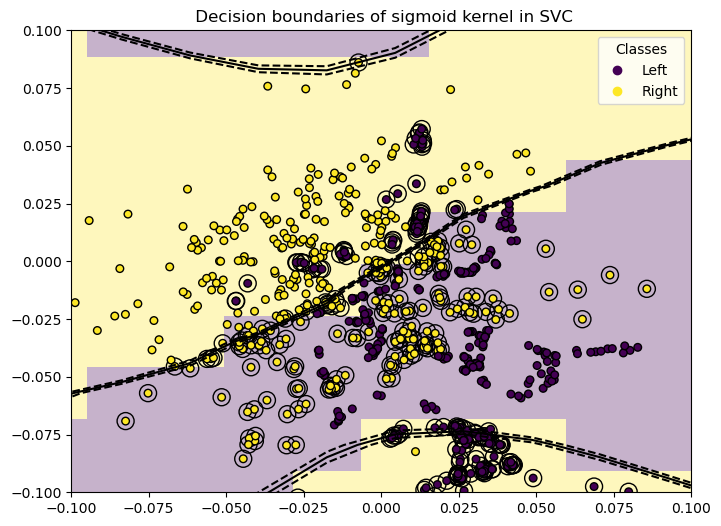

In [213]:
plot_training_data_with_decision_boundary('sigmoid')

In [256]:
from sklearn.neighbors import KNeighborsClassifier

X = select_edges(40)
    
#balance the dataset through oversampling
sme = SMOTEENN() #random_state=40
X_res, y_res = sme.fit_resample(X, handedness_class)

# Split into a train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res) #random_state=0

#create an SVM Model
neigh = KNeighborsClassifier(n_neighbors=5)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

point = [num*2, balanced_accuracy_score(y_test, y_pred)]
print(point)
#balanced_acc.append(point)

[np.int64(100), np.float64(0.9353070175438596)]


## Regression

Spectral Embedding doesn't work so we can not build a regression

In [214]:
num=40

X = select_edges(num)

#using nearesst neighbors as the distance function
embedding = SpectralEmbedding(n_components=1)
X_transformed = embedding.fit_transform(X)
# X_transformed.shape

#fit a linear model to transformed data
coefficients = np.polyfit(X_transformed.flatten(), handedness, 1)
polynomial = np.poly1d(coefficients)
y_regression = polynomial(X_transformed.flatten())

print(f'MSE: {mean_squared_error(y_regression, handedness)}')

MSE: 1707.0485230443678


Text(0.5, 1.0, 'Regression of Handedness')

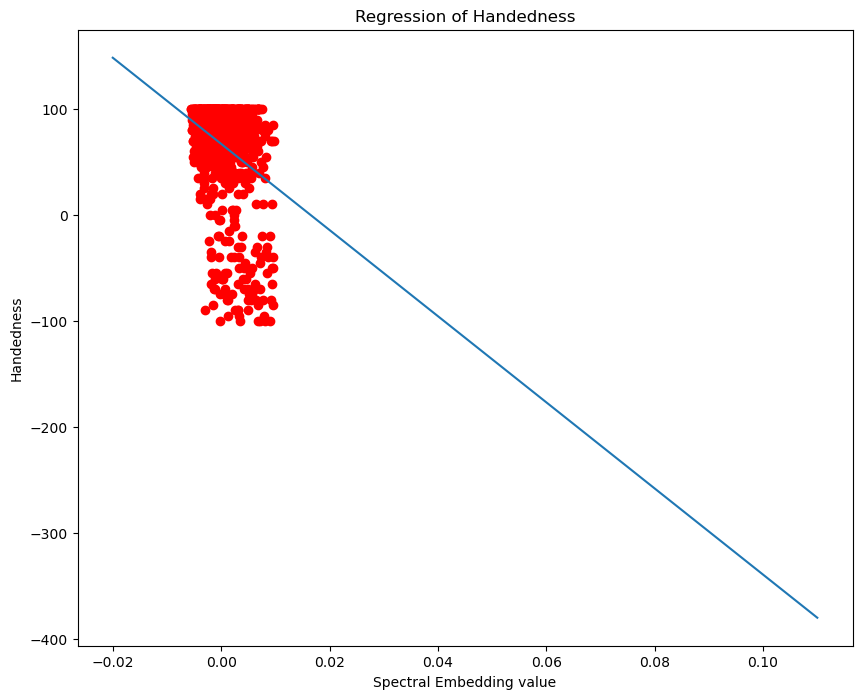

In [215]:
fig, ax = plt.subplots(figsize = (10, 8))
ax.scatter(X_transformed.flatten(), handedness, color='r')
ax.plot(np.arange(-0.02, 0.12, 0.01), polynomial(np.arange(-0.02, 0.12, 0.01)))
plt.xlabel('Spectral Embedding value')
plt.ylabel('Handedness')
ax.set_title('Regression of Handedness')

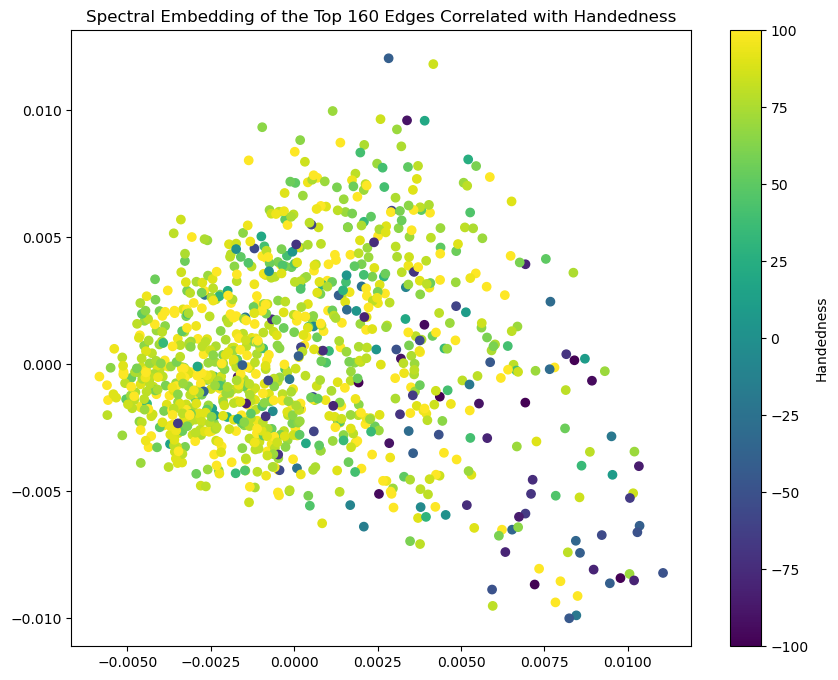

In [216]:
num=80
X = select_edges(num)
#using nearesst neighbors as the distance function
embedding = SpectralEmbedding(n_components=2)
X_transformed = embedding.fit_transform(X)
# X_transformed.shape
plot_spectral_embedding(X_transformed)

## Using PCA on Spectral Embeding Reduced to 2 dimensions

In [217]:
pca = PCA(n_components=1)
X_train, X_test, y_train, y_test = train_test_split(X_transformed, handedness, test_size=0.10, random_state=15) #test size is small is we have limited data
pca

PCA(n_components=1)

In [218]:
#fit and train the data
pca_train = pca.fit_transform(X_train)

#fit a linear model to the transformed data
coefficients = np.polyfit(pca_train.flatten(), y_train, 1)
polynomial = np.poly1d(coefficients)
y_regression = polynomial(pca_train)

#pca test
pca_test = pca.transform(X_test)
y_regression_test = polynomial(pca_test)

print(f'Train set MSE: {mean_squared_error(y_regression, y_train)}')
print(f'Test set MSE: {mean_squared_error(y_regression_test, y_test)}')

Train set MSE: 1775.4471964500844
Test set MSE: 1443.3338805618855


Text(0.5, 1.0, 'Regression of Handedness')

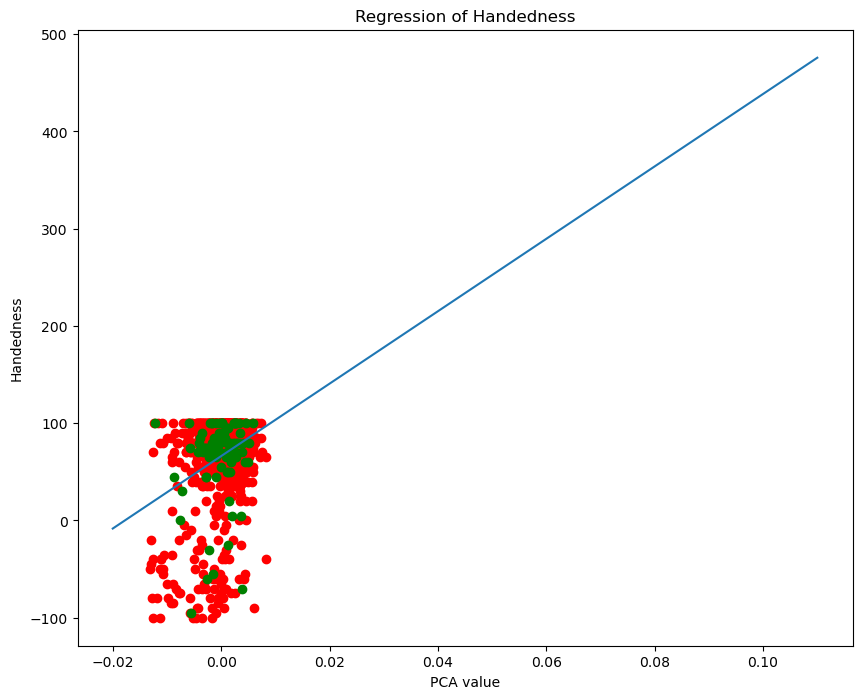

In [219]:
fig, ax = plt.subplots(figsize = (10, 8))
ax.scatter(pca_train.flatten(), y_train, color='r')
ax.plot(np.arange(-0.02, 0.12, 0.01), polynomial(np.arange(-0.02, 0.12, 0.01)))
ax.scatter(pca_test.flatten(), y_test, color='g')
plt.xlabel('PCA value')
plt.ylabel('Handedness')
ax.set_title('Regression of Handedness')

In [220]:
nums = np.arange(5, 55, 5)
train_mse = []
test_mse = []
for num in nums:
    #changed back to 100 for speed
    for i in range(100):
        X = select_edges(num)
        #using nearesst neighbors as the distance function
        embedding = SpectralEmbedding(n_components=2)
        X_transformed = embedding.fit_transform(X)
        pca = PCA(n_components=1)
        X_train, X_test, y_train, y_test = train_test_split(X_transformed, handedness, test_size=0.10) #test size is small is we have limited data

        #fit and train the data
        pca_train = pca.fit_transform(X_train)
        
        #fit a linear model to the transformed data
        coefficients = np.polyfit(pca_train.flatten(), y_train, 1)
        polynomial = np.poly1d(coefficients)
        y_regression = polynomial(pca_train)
        
        #pca test
        pca_test = pca.transform(X_test)
        y_regression_test = polynomial(pca_test)
        
        train_mse.append([num, mean_squared_error(y_regression, y_train)])
        test_mse.append([num, mean_squared_error(y_regression_test, y_test)])

In [361]:
train_mse_dct = {}
test_mse_dct = {}
for i,j in train_mse:
    if i not in train_mse_dct:
        train_mse_dct[i] = 0
    train_mse_dct[i] += j

for i,j in test_mse:
    if i not in test_mse_dct:
        test_mse_dct[i] = 0
    test_mse_dct[i] += j

for i in train_mse_dct:
    train_mse_dct[i] = train_mse_dct[i]/10

for i in test_mse_dct:
    test_mse_dct[i] = test_mse_dct[i]/10

train_mse_mean = list(train_mse_dct.items())
test_mse_mean = list(test_mse_dct.items())

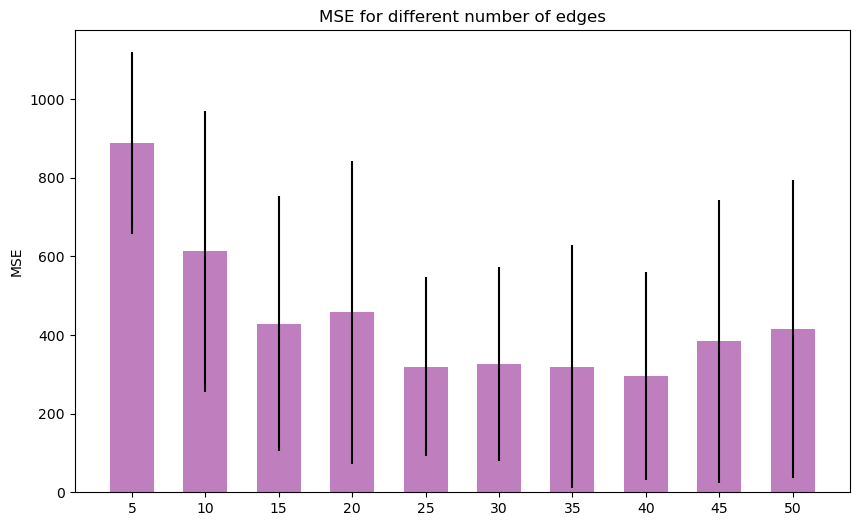

In [362]:

# Provided data
data = train_mse

# Convert to DataFrame
results = pd.DataFrame(data, columns=["Edges_Num", "MSE"])

# Group by year and compute mean & standard deviation
grouped = results.groupby("Edges_Num")["MSE"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=3)

plt.xticks(mean_values.index)
plt.ylabel("MSE")
plt.title("MSE for different number of edges")
plt.show()

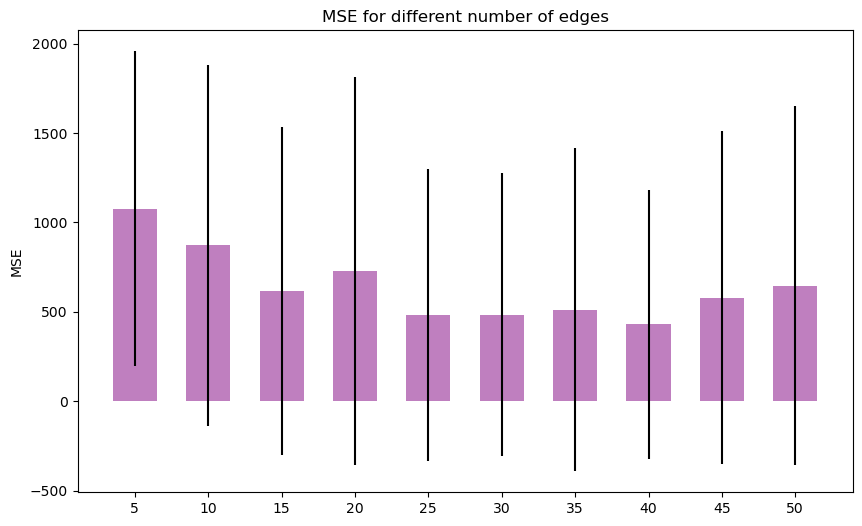

In [363]:
# Provided data
data = test_mse

# Convert to DataFrame
df = pd.DataFrame(data, columns=["Edges_Num", "MSE"])

# Group by year and compute mean & standard deviation
grouped = df.groupby("Edges_Num")["MSE"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=3)

plt.xticks(mean_values.index)
plt.ylabel("MSE")
plt.title("MSE for different number of edges")
plt.show()

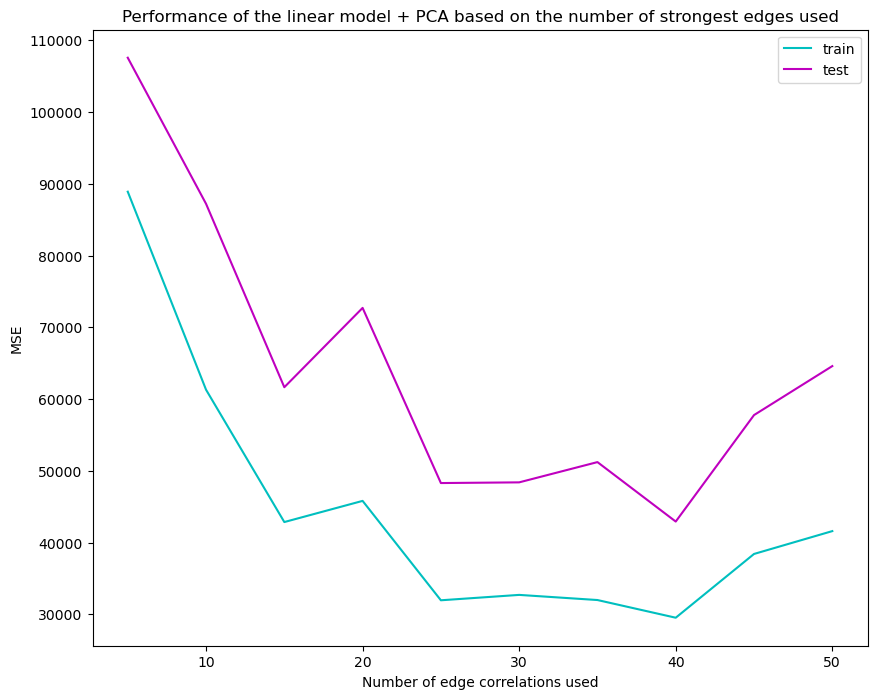

In [364]:
train_mse_mean = np.array(train_mse_mean) # Balanced Accuracy is the average of recall obtained on each class
test_mse_mean = np.array(test_mse_mean) 

fig, ax = plt.subplots(figsize = (10, 8))

#create scatter plot
ax.plot(train_mse_mean[:, 0], train_mse_mean[:, 1], color='c', label='train')
ax.plot(test_mse_mean[:, 0], test_mse_mean[:, 1], color='m', label='test')

ax.set_title(f'Performance of the linear model + PCA based on the number of strongest edges used')

plt.xlabel('Number of edge correlations used')
plt.ylabel('MSE')
plt.legend()

plt.show()


In [270]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=8)
X_train, X_test, y_train, y_test = train_test_split(X, handedness, test_size=0.10)
neigh.fit(X_train, y_train)
y_pred = neigh.predict(X_test)
print(mean_squared_error(y_regression_test, y_test))

2097.151257351741


# Unnecessary

In [197]:
import numpy as np

def create_symmetric_gaussian_matrix(size, mean=0.00243, std_dev=0.044):
    """
    Creates a symmetric square matrix of Gaussian noise with ones on the diagonal.
    
    Parameters:
    size (int): The size of the matrix (e.g., 5 for a 5x5 matrix).
    mean (float): The mean of the Gaussian distribution (default is 0).
    std_dev (float): The standard deviation of the Gaussian distribution (default is 1).
    
    Returns:
    np.ndarray: A symmetric matrix with Gaussian noise and ones on the diagonal.
    """
    # Generate a random matrix of Gaussian noise (lower triangular part)
    matrix = np.random.normal(loc=mean, scale=std_dev, size=(size, size))
    
    # Make the matrix symmetric by averaging with its transpose
    matrix = np.tril(matrix) + np.tril(matrix, -1).T
    
    # Set ones on the diagonal
    np.fill_diagonal(matrix, 1)
    
    return matrix

In [19]:
def generate_random_sequence(size, low=0, high=718):
    np.random.seed(10)
    return np.random.randint(low, high, size)

In [199]:
fake_data = []
for i in range(172):
    fake_mat = create_symmetric_gaussian_matrix(718)
    fake_data.append(fake_mat)
fake_data = np.array(fake_data)

In [169]:
#correlation_matrix[np.isnan(correlation_matrix)] = 1.0

In [239]:
def correlate(fake_data, rand_sample, handedness):
    forced_mat = []
    for i, mat in enumerate(fake_data):
        score = handedness[i]
        weight_score = np.array(weight_function(np.arange(0, 718), score))
        weight_score[rand_sample] = 1
        
        W = np.diag(weight_score)
        mat = np.matmul(W, fake_data[i])
        # mat[mat >= 1.0] = 0.99 
        # z_trans = np.arctanh(mat)
        forced_mat.append(mat)
        if i%10 == 0:
            print(i)
    return np.array(forced_mat)

In [ ]:
weight_score = np.array(weight_function(np.arange(0, 718), score))

## using current handedness

1.0
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


/tmp/ipykernel_416/3245410976.py:8: RuntimeWarning: invalid value encountered in arctanh
  z_forced_mat = np.arctanh(forced_mat)


8454


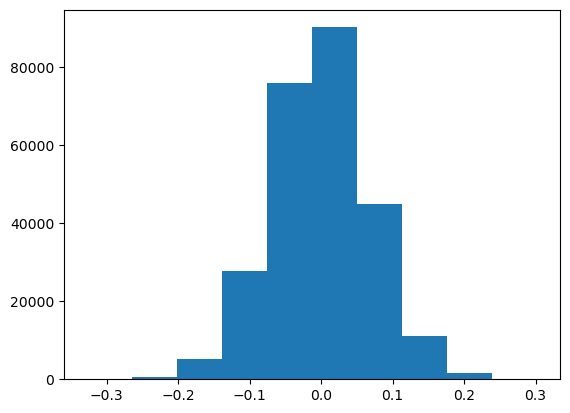

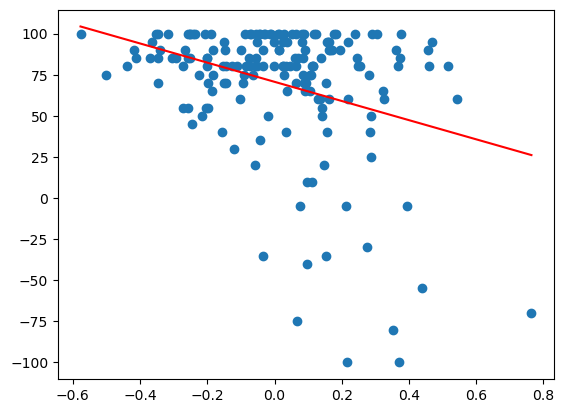

0.775
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
7411


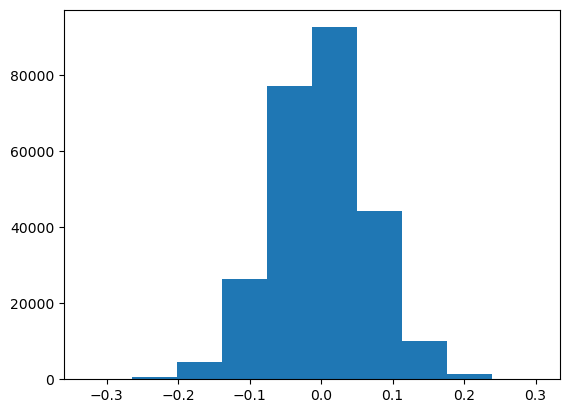

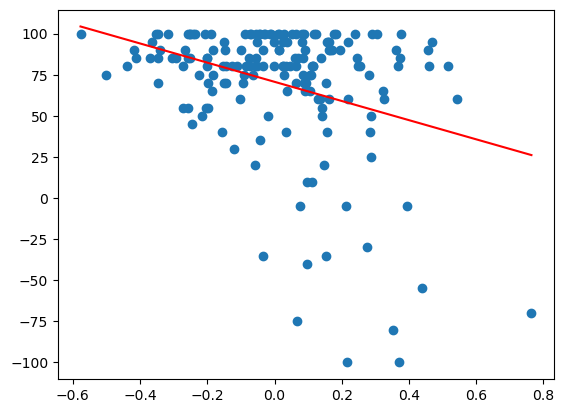

0.55
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
6053


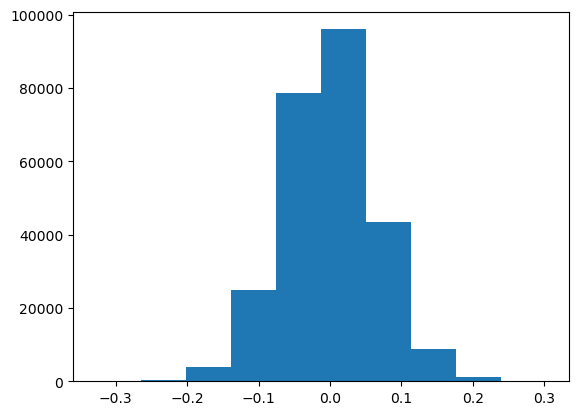

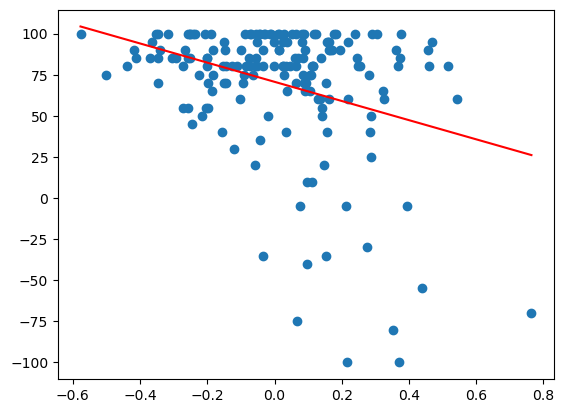

0.32499999999999996
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
4490


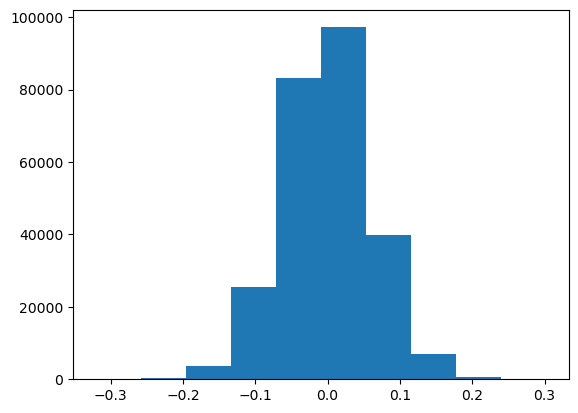

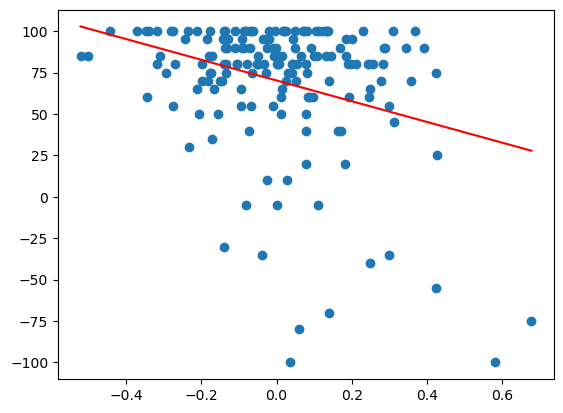

0.1
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
2429


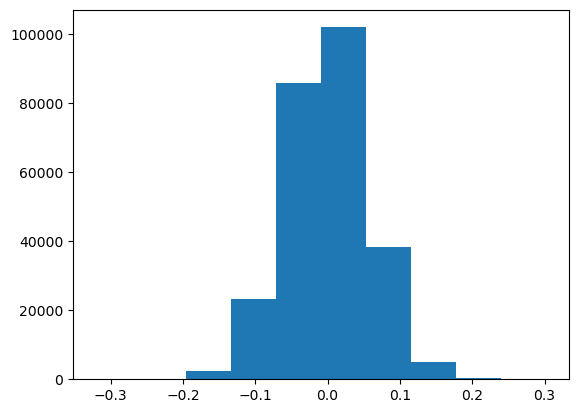

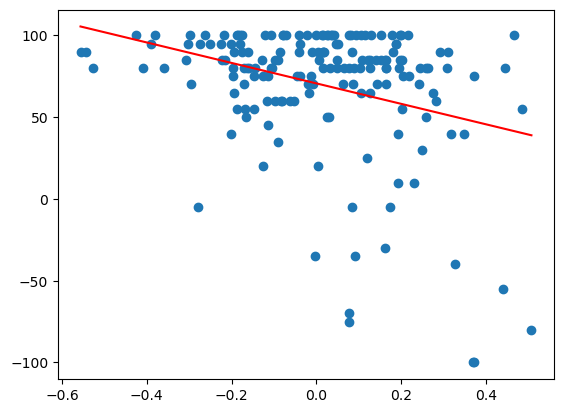

In [26]:
splits = np.linspace(1, 0.1, 5)
means = []
for i in splits:
    print(i)
    rand_sample = generate_random_sequence(int(718*i))
    forced_mat = correlate(fake_data, rand_sample)
    forced_mat[forced_mat == 1.0] = np.nan
    z_forced_mat = np.arctanh(forced_mat)
    corr_mat, pval_mat = sig_pvals(z_forced_mat)
    corr_sig = np.array(list(corr_mat.values()))
    plt.hist(corr_sig)
    bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
    plt.axvline(bottom_5, color='red')
    plt.axvline(top_5, color = 'red')
    plt.show()
    linear_plot(corr_mat, z_forced_mat, handedness, order=0)

In [ ]:
# using balanced handedness

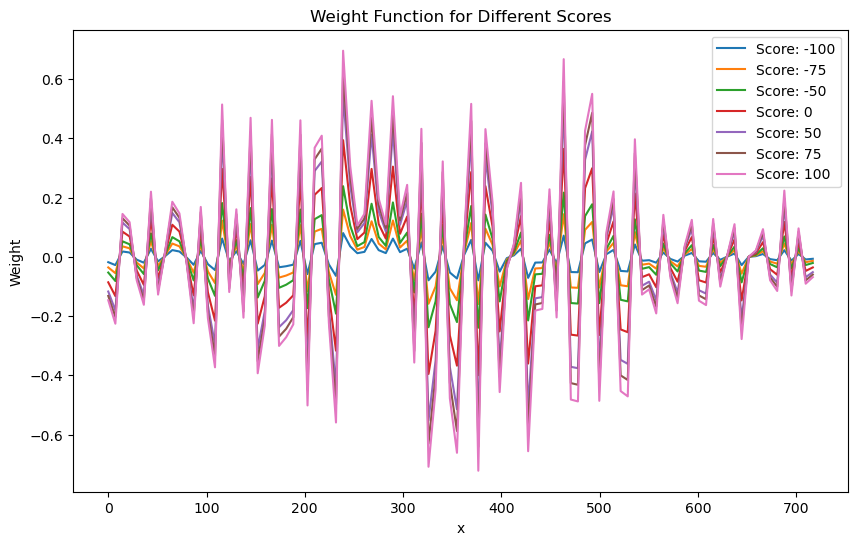

In [301]:
import numpy as np
import matplotlib.pyplot as plt

def weight_function(x, score, amp_0=0.1, f1=1.9, s1=3, f2=6, s2=5, f3=4.5, s3=1.3, w=250, b0=350, c=0.1, alpha=0.8, exp_damp=0.1):
    """
    Generates weights correlated with a score (-100 to 100)
    """
    
    # Compute b as a function of score
    b = b0 + c * score
    
    # Compute amp as a function of score
    amp = amp_0 * (1 + alpha * score / 100)
    
    # Sinusoidal component with dampened exponent to prevent overflow
    sinusoidal = (f1 * np.sin(s1 * x) + f2 * np.sin(s2 * np.exp(exp_damp * x)) + f3 * np.sin(s3 * np.pi * x))
    
    # Gaussian component
    gaussian = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - b) / w) ** 2)
    
    # Final weight function
    return amp * sinusoidal * gaussian

# Example usage
x_values = np.linspace(0, 717, 100)
scores = [-100, -75, -50, 0, 50, 75, 100]  # Example scores

plt.figure(figsize=(10, 6))
for score in scores:
    weights = weight_function(x_values, score)
    plt.plot(x_values, weights, label=f'Score: {score}')

plt.xlabel('x')
plt.ylabel('Weight')
plt.legend()
plt.title('Weight Function for Different Scores')
plt.show()


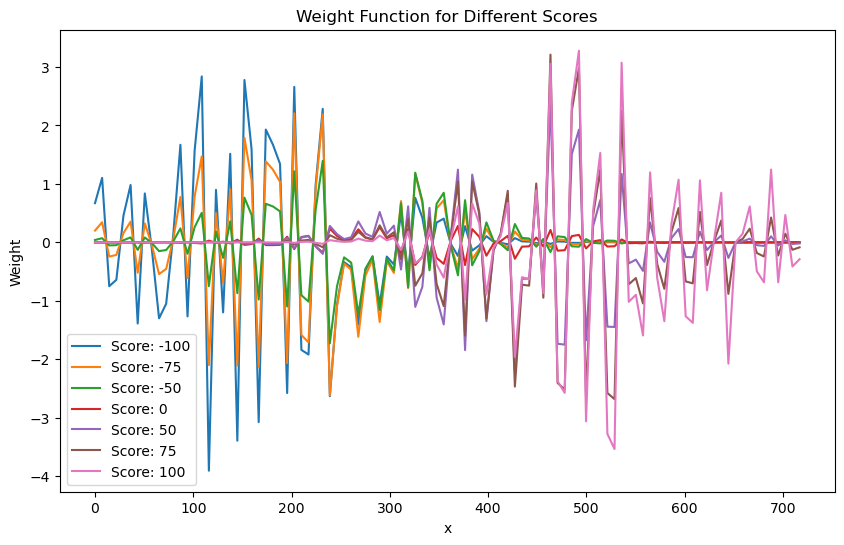

In [287]:
def weight_function(x, score, amp_0=0.1, f1=1.9, s1=3, f2=6, s2=5, f3=4.5, s3=1.3, w=100, b0=350, c=2, alpha=1, exp_damp=0.1):
    """
    Generates weights correlated with a score (-100 to 100)
    """
    
    # Compute b as a function of score
    b = b0 + c * score
    
    # Compute amp as a function of score
    amp = amp_0 * (1 + alpha * score / 10)
    
    # Sinusoidal component with dampened exponent to prevent overflow
    sinusoidal = (f1 * np.sin(s1 * x) + f2 * np.sin(s2 * np.exp(exp_damp * x)) + f3 * np.sin(s3 * np.pi * x))
    
    # Gaussian component
    gaussian = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - b) / w) ** 2)
    
    # Final weight function
    return amp * sinusoidal * gaussian

# Example usage
x_values = np.linspace(0, 717, 100)
scores = [-100, -75, -50, 0, 50, 75, 100]  # Example scores

plt.figure(figsize=(10, 6))
for score in scores:
    weights = weight_function(x_values, score)
    plt.plot(x_values, weights, label=f'Score: {score}')

plt.xlabel('x')
plt.ylabel('Weight')
plt.legend()
plt.title('Weight Function for Different Scores')
plt.show()

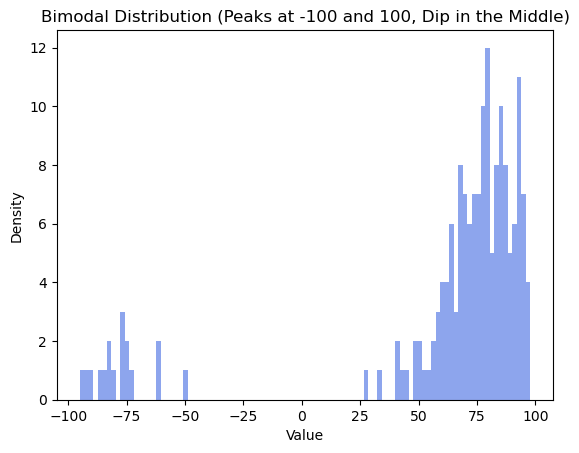

In [307]:
from scipy.stats import beta

def generate_bimodal_beta(size=2000, a=5, b=5):
    """
    Generates a bimodal distribution with two peaks at -100 and 100 using Beta distributions.
    
    Parameters:
    - size: Total number of samples.
    - a, b: Shape parameters for the Beta distribution (adjusts peak sharpness).
    
    Returns:
    - A NumPy array containing the generated bimodal distribution.
    """
    # Generate from Beta(2,5) and flip one to the negative side
    size_a = int(size * 0.1)
    size_b = size - size_a
    left_peak = -100 + 100 * beta.rvs(a, b, size=size_a)  # Shifted to -100
    right_peak = 100 - 100 * beta.rvs(a, b, size=size_b)  # Shifted to 100

    # Combine
    bimodal_data = np.hstack([left_peak, right_peak])
    
    return bimodal_data

# Generate data
size = 172
bimodal_data = generate_bimodal_beta(size, a=2, b=7)

# Plot histogram
plt.hist(bimodal_data, bins=100, density=False, alpha=0.6, color='royalblue')
plt.title("Bimodal Distribution (Peaks at -100 and 100, Dip in the Middle)")
plt.xlabel("Value")
plt.ylabel("Density")
plt.show()

In [308]:
fake_data = np.array(fake_data)

0.1
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
13035


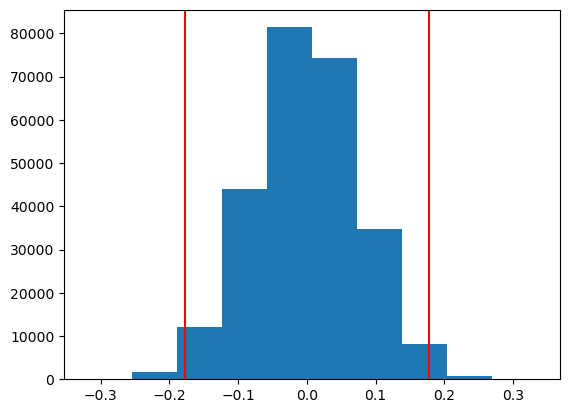

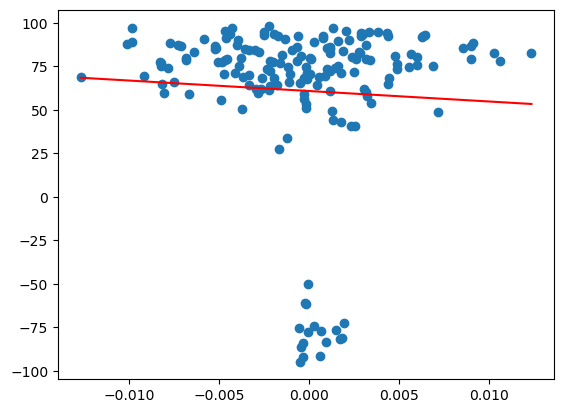

0.325
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


KeyboardInterrupt: 

In [309]:
splits = np.linspace(0.1, 1, 5)
means = []
for i in splits:
    print(i)
    rand_sample = generate_random_sequence(int(718*i))
    forced_mat = correlate(fake_data, rand_sample, bimodal_data)
    forced_mat[forced_mat >= 1.0] = np.nan
    # z_forced_mat = np.arctanh(forced_mat)
    corr_mat, pval_mat = sig_pvals(forced_mat)
    corr_sig = np.array(list(corr_mat.values()))
    plt.hist(corr_sig)
    bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
    plt.axvline(bottom_5, color='red')
    plt.axvline(top_5, color = 'red')
    plt.show()
    linear_plot(corr_mat, forced_mat, bimodal_data, order=0)

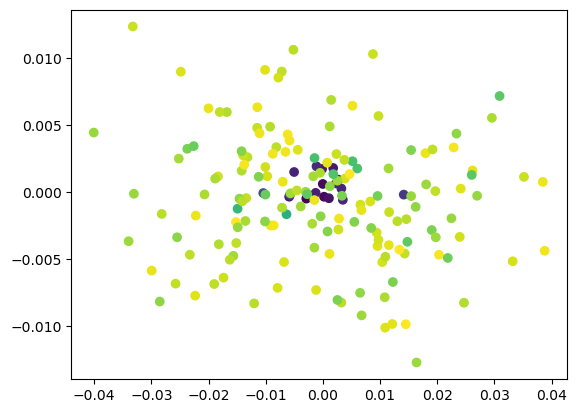

In [310]:
lst = sorted(corr_mat, key=lambda x: corr_mat[x])
corr_mat[lst[0]]
corr_mat[lst[-1]]
plt.scatter(forced_mat[:, lst[-1][0], lst[-1][1]], forced_mat[:, lst[0][0], lst[0][1]], c=bimodal_data)

In [33]:
def linear_plot(corr_mat, z_forced_mat, handedness, order=0):
    sorted_keys = sorted(corr_mat, key=lambda x: corr_mat[x])
    
    coefficients = np.polyfit(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]],  handedness, 1)
    polynomial = np.poly1d(coefficients)
    y_regression = polynomial(np.sort(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]]))
    
    plt.plot(np.sort(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]]), y_regression, color='red')
    
    plt.scatter(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]],  handedness)
    plt.show()

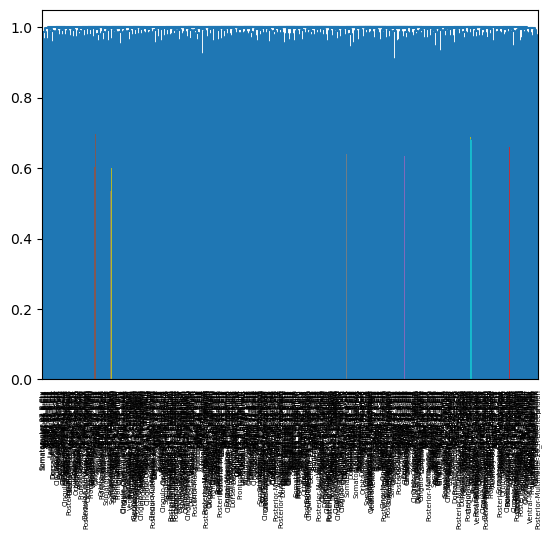

In [123]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform 

# Assuming 'corr_matrix' is your pre-calculated correlation matrix 
# Convert correlation matrix to a distance matrix (1 - correlation)
distance_matrix = 1 - np.abs(sym_m) 

# Perform hierarchical clustering using 'complete' linkage
Z = linkage(squareform(distance_matrix), method='complete') 

# Plot the dendrogram 
dendrogram(Z, labels=list(hcp.ca_parcels['labels'].values())[1:], leaf_rotation=90) 

clusters = fcluster(Z, 12, criterion='maxclust', depth=2, R=None, monocrit=None)

In [129]:
cluster_dct = {}
for i, j in zip(clusters, list(hcp.ca_parcels['labels'].values())[1:]):
    if i not in cluster_dct:
        cluster_dct[i] = []
    cluster_dct[i].append(j)

In [135]:
cluster_dct[10]

[np.str_('Visual2-29_L-Ctx'),
 np.str_('Visual2-30_L-Ctx'),
 np.str_('Visual2-34_L-Ctx'),
 np.str_('Visual2-35_L-Ctx'),
 np.str_('Visual2-36_L-Ctx'),
 np.str_('Visual2-38_L-Ctx'),
 np.str_('Visual2-41_L-Ctx'),
 np.str_('Somatomotor-34_L-Ctx'),
 np.str_('Cingulo-Opercular-43_L-Ctx'),
 np.str_('Somatomotor-35_L-Ctx'),
 np.str_('Somatomotor-36_L-Ctx'),
 np.str_('Cingulo-Opercular-48_L-Ctx'),
 np.str_('Visual2-51_L-Ctx'),
 np.str_('Default-73_L-Ctx'),
 np.str_('Visual2-02_R-Ctx'),
 np.str_('Visual2-03_R-Ctx'),
 np.str_('Visual2-04_R-Ctx'),
 np.str_('Visual2-05_R-Ctx'),
 np.str_('Visual2-06_R-Ctx'),
 np.str_('Visual2-07_R-Ctx'),
 np.str_('Visual2-11_R-Ctx'),
 np.str_('Visual2-14_R-Ctx'),
 np.str_('Somatomotor-14_R-Ctx'),
 np.str_('Cingulo-Opercular-16_R-Ctx'),
 np.str_('Somatomotor-15_R-Ctx'),
 np.str_('Somatomotor-16_R-Ctx'),
 np.str_('Cingulo-Opercular-19_R-Ctx'),
 np.str_('Cingulo-Opercular-20_R-Ctx'),
 np.str_('Cingulo-Opercular-21_R-Ctx'),
 np.str_('Cingulo-Opercular-22_R-Ctx'),
 np.st

In [73]:
1 - np.abs(np.round(correlation_matrix[0], 3)) 

array([[0.   , 0.977, 0.936, ..., 0.996, 0.989, 0.988],
       [0.977, 0.   , 0.972, ..., 0.967, 0.978, 0.998],
       [0.936, 0.972, 0.   , ..., 0.992, 0.987, 0.99 ],
       ...,
       [0.996, 0.967, 0.992, ..., 0.   , 0.988, 0.994],
       [0.989, 0.978, 0.987, ..., 0.988, 0.   , 0.972],
       [0.988, 0.998, 0.99 , ..., 0.994, 0.972, 0.   ]],
      shape=(718, 718), dtype=float32)

In [77]:
np.triu(correlation_matrix[0])

array([[ 1.        ,  0.02270541,  0.06385531, ..., -0.00370855,
        -0.01087578, -0.01174463],
       [ 0.        ,  1.        ,  0.02763665, ...,  0.03280056,
         0.021624  ,  0.00245521],
       [ 0.        ,  0.        ,  1.        , ...,  0.00840014,
        -0.01308579, -0.0100534 ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  1.        ,
         0.01174293, -0.00579708],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.        ,  0.0278465 ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  1.        ]], shape=(718, 718), dtype=float32)

In [78]:
def make_symmetric(upper_tri):
    """
    Given the upper triangular part of a correlation matrix, reconstruct the full symmetric matrix.

    Parameters:
    - upper_tri: (n, n) NumPy array with the upper triangle filled, lower part can be zeros.

    Returns:
    - A symmetric (n, n) correlation matrix.
    """
    symmetric_matrix = upper_tri + upper_tri.T - np.diag(np.diag(upper_tri))  # Reflect upper to lower
    np.fill_diagonal(symmetric_matrix, 1)  # Ensure diagonal is 1
    return symmetric_matrix

In [80]:
sym_m = make_symmetric(np.triu(correlation_matrix[0]))

In [89]:
len(hcp.ca_parcels['labels'])

719

In [104]:
import hcp_utils as hcp
hcp.view_parcellation(hcp.mesh.inflated, hcp.ca_parcels)#.savefig('img1.png')

In [136]:
hcp.view_parcellation(hcp.mesh.inflated, hcp.mmp)

In [111]:
hcp.ca_network#['map_all']

{'ids': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 'map_all': array([9, 3, 6, ..., 7, 7, 7], shape=(91282,)),
 'labels': {np.int64(0): np.str_(''),
  np.int64(1): np.str_('Visual1'),
  np.int64(2): np.str_('Visual2'),
  np.int64(3): np.str_('Somatomotor'),
  np.int64(4): np.str_('Cingulo-Opercular'),
  np.int64(5): np.str_('Dorsal-attention'),
  np.int64(6): np.str_('Language'),
  np.int64(7): np.str_('Frontoparietal'),
  np.int64(8): np.str_('Auditory'),
  np.int64(9): np.str_('Default'),
  np.int64(10): np.str_('Posterior-Multimodal'),
  np.int64(11): np.str_('Ventral-Multimodal'),
  np.int64(12): np.str_('Orbito-Affective')},
 'rgba': {np.int64(0): array([1., 1., 1., 0.]),
  np.int64(1): array([0., 0., 1., 1.]),
  np.int64(2): array([0.392157, 0.      , 1.      , 1.      ]),
  np.int64(3): array([0., 1., 1., 1.]),
  np.int64(4): array([0.6, 0. , 0.6, 1. ]),
  np.int64(5): array([0., 1., 0., 1.]),
  np.int64(6): array([0.      , 0.603922, 0.603922, 1.      ]),
  np

In [112]:
hcp.ca_parcels

{'ids': array([    0,     1,     2,     3,     4,     5,     6,     7,     8,
            9,    10,    11,    12,    13,    14,    15,    16,    17,
           18,    19,    20,    21,    22,    23,    24,    25,    26,
           27,    28,    29,    30,    31,    32,    33,    34,    35,
           36,    37,    38,    39,    40,    41,    42,    43,    44,
           45,    46,    47,    48,    49,    50,    51,    52,    53,
           54,    55,    56,    57,    58,    59,    60,    61,    62,
           63,    64,    65,    66,    67,    68,    69,    70,    71,
           72,    73,    74,    75,    76,    77,    78,    79,    80,
           81,    82,    83,    84,    85,    86,    87,    88,    89,
           90,    91,    92,    93,    94,    95,    96,    97,    98,
           99,   100,   101,   102,   103,   104,   105,   106,   107,
          108,   109,   110,   111,   112,   113,   114,   115,   116,
          117,   118,   119,   120,   121,   122,   123,   124,   125,

In [120]:
hcp.ca_network#['map_all']

{'ids': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 'map_all': array([9, 3, 6, ..., 7, 7, 7], shape=(91282,)),
 'labels': {np.int64(0): np.str_(''),
  np.int64(1): np.str_('Visual1'),
  np.int64(2): np.str_('Visual2'),
  np.int64(3): np.str_('Somatomotor'),
  np.int64(4): np.str_('Cingulo-Opercular'),
  np.int64(5): np.str_('Dorsal-attention'),
  np.int64(6): np.str_('Language'),
  np.int64(7): np.str_('Frontoparietal'),
  np.int64(8): np.str_('Auditory'),
  np.int64(9): np.str_('Default'),
  np.int64(10): np.str_('Posterior-Multimodal'),
  np.int64(11): np.str_('Ventral-Multimodal'),
  np.int64(12): np.str_('Orbito-Affective')},
 'rgba': {np.int64(0): array([1., 1., 1., 0.]),
  np.int64(1): array([0., 0., 1., 1.]),
  np.int64(2): array([0.392157, 0.      , 1.      , 1.      ]),
  np.int64(3): array([0., 1., 1., 1.]),
  np.int64(4): array([0.6, 0. , 0.6, 1. ]),
  np.int64(5): array([0., 1., 0., 1.]),
  np.int64(6): array([0.      , 0.603922, 0.603922, 1.      ]),
  np

In [119]:
len(hcp.ca_parcels['nontrivial_ids'])

718